In [1]:
from torchvision.datasets.folder import ImageFolder
from torchvision import transforms
from torch.utils.data import DataLoader
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm
from statistics import mean
import impaintingLib as imp

import torchvision
from mpl_toolkits.axes_grid1 import ImageGrid

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def plot_img(x,title=""):
    img_grid = make_grid(x[:16])
    plt.figure(figsize=(20,15))
    plt.imshow(img_grid.cpu().permute(1, 2, 0))
    plt.axis('off')
    if title:
        plt.title(title)
    plt.show()
    
def getTestData(file,factorResize=1):
    resize = (120*factorResize, 120*factorResize)
    crop   = (64*factorResize, 64*factorResize)
    process = transforms.Compose([
         transforms.Resize(resize), 
         transforms.CenterCrop(crop),
         transforms.ToTensor()
    ])
    return ImageFolder(file, process)

### Méthode pour ségmenter l'input

In [2]:
import impaintingLib as imp
classif = imp.loss.getTrainedModel()

def simplifyChannels(x):
    x = np.where(x == 3, 0, x) 
    x = np.where(x == 4, 3, x) 
    x = np.where(x == 5, 3, x) 
    x = np.where(x == 6, 4, x) 
    x = np.where(x == 7, 4, x) 
    x = np.where(x == 8, 5, x) 
    x = np.where(x == 9, 5, x) 
    x = np.where(x == 10 , 6, x) 
    x = np.where(x == 11, 7, x) 
    x = np.where(x == 12, 7, x)  
    x = np.where(x > 12, 0, x)
    return x

def npToTensor(x):
    c,w,h = x.shape
    x = torch.from_numpy(x).to(device)
    x = torch.reshape(x, (c,1,w,h))
    return x.float()

def get_segmentation(x, segmenter=classif, scale_factor=4, simplify=True):
    n,c,w,h = x.shape
    with torch.no_grad():
        if scale_factor > 0 :
            x = torch.nn.functional.interpolate(x, scale_factor=scale_factor)
        x = transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))(x)
        y = classif(x)
        if scale_factor > 0 :
            y = torch.nn.functional.avg_pool2d(y, scale_factor)
            
    y = imp.loss.generate_label_plain(y,w)
    if simplify: 
        y = simplifyChannels(y)
    y =  (y / (np.amax(y)+2)) + 0.1
    y = npToTensor(y)
    return y

In [4]:
def train_inpainting_segmented(net, optimizer, loader, alter, scale_factor=4, epochs=5, min_cut=15,max_cut=45, simplify_seg=True, show_images=True):
    
    for epoch in range(epochs):
        running_loss = []
        t = tqdm(loader)
        for x, _ in t:
            x = x.to(device)
            segmented = get_segmentation(x, simplify=simplify_seg, scale_factor=scale_factor)
            x_prime = alter(x)
            x_input = torch.cat((x_prime, segmented),dim=1)
            outputs = net(x_input)
            
            loss = torch.nn.L1Loss()(outputs, x) 
            loss += imp.loss.perceptualVGG(outputs, x) 
            loss += imp.loss.totalVariation(outputs, x)
            
            running_loss.append(loss.item())
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            t.set_description(f'training loss: {mean(running_loss)}, epoch: {epoch}/{epochs}')
        if show_images:
            plot_img(x[:8])
            plot_img(x_prime[:8])
            plot_img(segmented[:8])
            plot_img(torch.clip(outputs[:8], 0, 1))
            
def test_results_sample(net, testloader, alter, simplify_seg=True, min_cut=15,max_cut=45, scale_factor=4,title=""):
    with torch.no_grad():
        x, _ = next(iter(testloader))
        x = x.to(device)
        segmented = get_segmentation(x, simplify=simplify_seg, scale_factor=scale_factor)
        x_prime = alter(x)
        x_input = torch.cat((x_prime, segmented),dim=1)
        outputs = net(x_input)
        #plot_img(x[:8])
        #plot_img(x_prime[:8])
        #plot_img(segmented[:8])
        plot_img(torch.clip(outputs[:8], 0, 1),title=title)

### Train avec noir et blanc 64X64

In [5]:
factorResize = 1
model = imp.model.UNet(4, netType="partial").to(device) 
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=0.001)
trainloader, testloader = imp.data.getFaces(shuffle=True,resize=factorResize)
alter = imp.mask.Alter(resize=factorResize,seed=0,test=True).irregularMask # squareMask irregularMask

In [ ]:
train_inpainting_segmented(model, optimizer, trainloader, alter, scale_factor=4, simplify_seg=True, epochs=40, min_cut=4, max_cut=60)
torch.save(model.state_dict(), "./modelSave/09_08/partial4channels_low")

### Test avec noir et blanc

In [ ]:
dataset = getTestData("./data/real")
testloader = DataLoader(dataset, num_workers=2, batch_size=16, shuffle=True)
model.load_state_dict(torch.load("./modelSave/09_08/partial4channels_low"))
model.eval()
test_results_sample(model, testloader, alter, simplify_seg=True,scale_factor=4)

### Train noir et blanc 128x128

In [26]:
factorResize = 2
model = imp.model.UNet(4, netType="partial").to(device) 
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=0.001)
trainloader, testloader = imp.data.getFaces(shuffle=True,resize=factorResize)
alter = imp.mask.Alter(resize=factorResize,seed=0,test=True).squareMask # squareMask irregularMask

In [ ]:
#model.load_state_dict(torch.load("./modelSave/09_08/partial4channels_low"))
#model.eval
train_inpainting_segmented(model, optimizer, trainloader, alter, scale_factor=2, simplify_seg=True, epochs=5)
torch.save(model.state_dict(),"./modelSave/09_08/partial4channelsNOKeypoint_mid")

In [ ]:
dataset = getTestData("./data/real",factorResize=2)
alter = imp.mask.Alter(resize=2,seed=0,test=True).irregularMask # squareMask irregularMask
model = imp.model.UNet(4, netType="partial").to(device) 
testloader = DataLoader(dataset, num_workers=2, batch_size=16, shuffle=True)
model.load_state_dict(torch.load("./modelSave/09_08/partial4channels_mid"))
model.eval()
with torch.no_grad():                                          
    test_results_sample(model, testloader, alter, simplify_seg=False,scale_factor=2)

### Comparaison 128x128 Simplify et Non Simplify

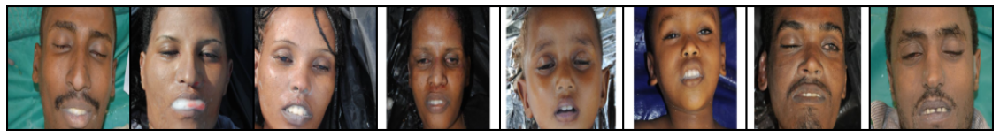

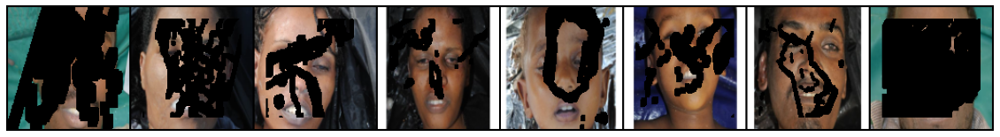

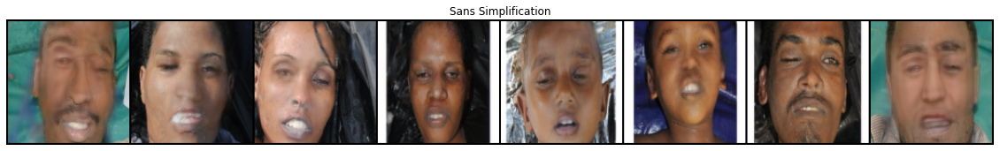

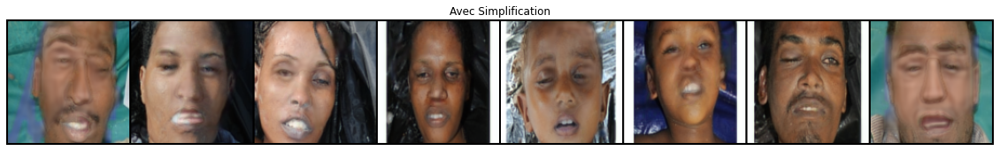

In [21]:
seed = 3
dataset = getTestData("./data/real",factorResize=2)
model = imp.model.UNet(4, netType="partial").to(device) 

torch.manual_seed(seed)
testloader = DataLoader(dataset, num_workers=2, batch_size=16, shuffle=False)

alter = imp.mask.Alter(resize=2,seed=seed,test=True).irregularMask # squareMask irregularMask
x,_ = next(iter(testloader))
x = x.to(device)
plot_img(x[:8])
x_prime = alter(x)
plot_img(x_prime[:8])

# Sans Simplification
alter = imp.mask.Alter(resize=2,seed=seed,test=True).irregularMask # squareMask irregularMask
model.load_state_dict(torch.load("./modelSave/09_08/partial4channels_mid"))
model.eval()
with torch.no_grad():
    test_results_sample(model, testloader, alter, simplify_seg=False,scale_factor=2,title="Sans Simplification")
    
# Avec Simplification
alter = imp.mask.Alter(resize=2,seed=seed,test=True).irregularMask # squareMask irregularMask
model.load_state_dict(torch.load("./modelSave/02_08/partial4channels_mid"))
model.eval()
with torch.no_grad():
    test_results_sample(model, testloader, alter, simplify_seg=True,scale_factor=2,title="Avec Simplification")

### Landmark detection

In [5]:
def visualize_batch(images_list, landmarks_list, shape = (1, 8), title = None, save = None):
    n,c,w,h = images_list.shape
    image_dim = w
    fig = plt.figure(figsize = (20, 15))
    grid = ImageGrid(fig, 111, nrows_ncols = shape, axes_pad = 0.08)
    for ax, image, landmarks in zip(grid, images_list, landmarks_list):
        image = (image - image.min())/(image.max() - image.min())
        landmarks = landmarks.view(-1, 2)
        landmarks = (landmarks + 0.5) * image_dim
        landmarks = landmarks.cpu().detach().numpy().tolist()
        landmarks = np.array([(x, y) for (x, y) in landmarks if 0 <= x <= image_dim and 0 <= y <= image_dim])

        ax.imshow(image[0].cpu(), cmap = 'gray')
        ax.scatter(landmarks[:, 0], landmarks[:, 1], s = 10, c = 'dodgerblue')
        ax.axis('off')

    if title:
        print(title)
    if save:
        plt.savefig(save)
    plt.show()

In [6]:
def addKeypoints(images_list, landmarks_list, shape = (1, 8), title = None, save = None):
    n,c,w,h = images_list.shape
    image_dim = w
    layers = torch.zeros((n,1, w, h), dtype=images_list.dtype, device=images_list.device)
    for i,(image, landmarks) in enumerate(zip(images_list, landmarks_list)):
        image = (image - image.min())/(image.max() - image.min())
        landmarks = landmarks.view(-1, 2)
        landmarks = (landmarks + 0.5) * image_dim
        landmarks = landmarks.cpu().detach().numpy().tolist()
        landmarks = np.array([(x, y) for (x, y) in landmarks if 0 <= x <= image_dim and 0 <= y <= image_dim])
        landmarks = torch.from_numpy(landmarks).to(device)
        
        layer = torch.empty((1, w, h), dtype=images_list.dtype, device=images_list.device).fill_(0.1)
        for x,y in landmarks:
            x = int(x.item())
            y = int(y.item())
            layer[0][y][x] = 1
        layers[i] = layer
    return layers

In [7]:
keypointModel = imp.model.XceptionNet().to(device) 
keypointModel.load_state_dict(torch.load("./modelSave/keypoint.pt"))
keypointModel.eval()

def getKeypoints(x, model=keypointModel, shape = (1, 8), title = None, save = None):
    x = torchvision.transforms.Grayscale()(x)
    keypoints = model(x)
    layers = addKeypoints(x, keypoints, shape = shape, title = title, save = save)
    return layers

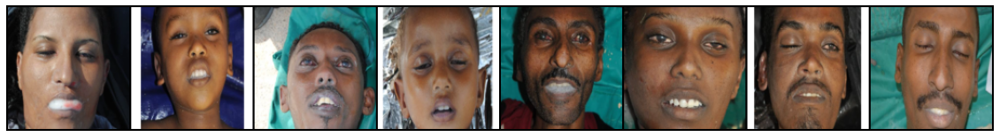

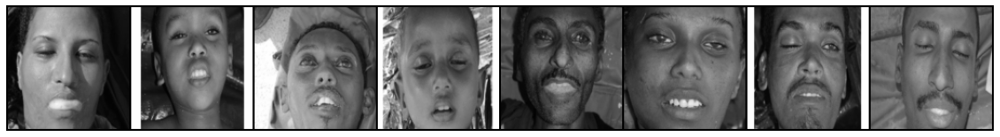

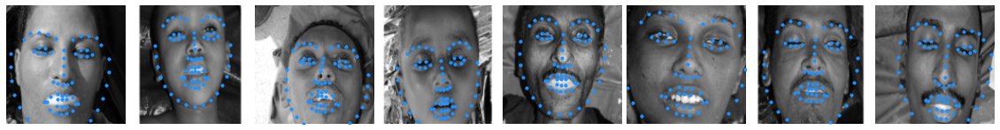

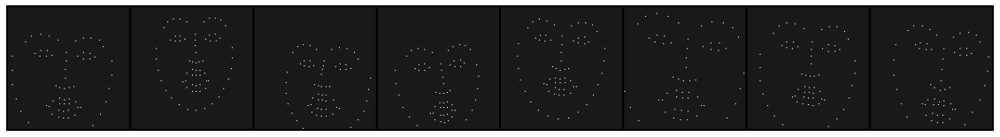

In [9]:
dataset = getTestData("./data/real",factorResize=2)
testloader = DataLoader(dataset, num_workers=2, batch_size=16, shuffle=True)
x,_ = next(iter(testloader))
x = x.to(device)

with torch.no_grad():
    plot_img(x[:8])
    x_gray = torchvision.transforms.Grayscale()(x)
    plot_img(x_gray[:8])
    res = keypointModel(x_gray)
    visualize_batch(x_gray,res)
    layers = getKeypoints(x)
    plot_img(layers[:8])

### Train avec 5 channels (3 RGB + 1 segm + 1 keypoints)

In [8]:
def train_inpainting_segmented_keypoints(net, optimizer, loader, alter, scale_factor=4, epochs=5, min_cut=15,max_cut=45, simplify_seg=True, show_images=True):
    
    for epoch in range(epochs):
        running_loss = []
        t = tqdm(loader)
        for x, _ in t:
            x = x.to(device)
            segmented = get_segmentation(x, simplify=simplify_seg, scale_factor=scale_factor)
            x_prime = alter(x)
            x_input = torch.cat((x_prime, segmented),dim=1)
            keypointLayer = getKeypoints(x)
            x_input = torch.cat((x_input, keypointLayer),dim=1)
        
            outputs = net(x_input)
            
            loss = torch.nn.L1Loss()(outputs, x) 
            loss += imp.loss.perceptualVGG(outputs, x) 
            loss += imp.loss.totalVariation(outputs, x)
            
            running_loss.append(loss.item())
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            t.set_description(f'training loss: {mean(running_loss)}, epoch: {epoch}/{epochs}')
        if show_images:
            plot_img(x[:8])
            plot_img(x_prime[:8])
            plot_img(segmented[:8])
            plot_img(torch.clip(outputs[:8], 0, 1))
            plot_img(keypointLayer[:8])
            
def test_results_sample_keypoints(net, testloader, alter, simplify_seg=True, min_cut=15,max_cut=45, scale_factor=4,title=""):
    with torch.no_grad():
        x, _ = next(iter(testloader))
        x = x.to(device)
        segmented = get_segmentation(x, simplify=simplify_seg, scale_factor=scale_factor)
        x_prime = alter(x)
        x_input = torch.cat((x_prime, segmented),dim=1)
        keypointLayer = getKeypoints(x)
        x_input = torch.cat((x_input, keypointLayer),dim=1)
        
        outputs = net(x_input)
        #plot_img(x[:8])
        #plot_img(x_prime[:8])
        #plot_img(segmented[:8])
        plot_img(torch.clip(outputs[:8], 0, 1),title=title)
        #plot_img(keypointLayer[:8])

  0%|          | 0/373 [00:00<?, ?it/s]

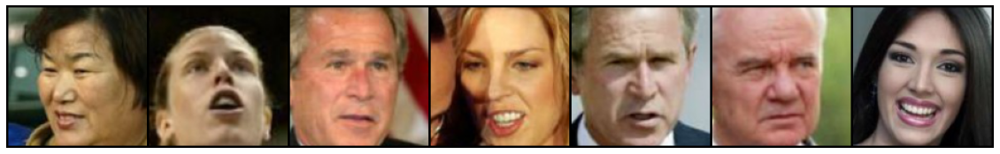

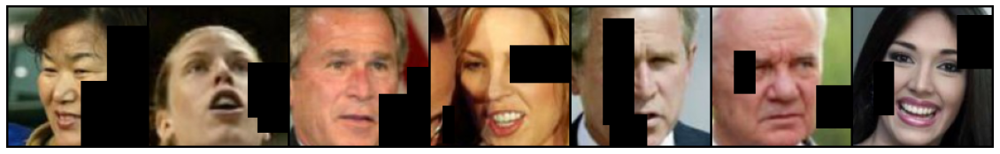

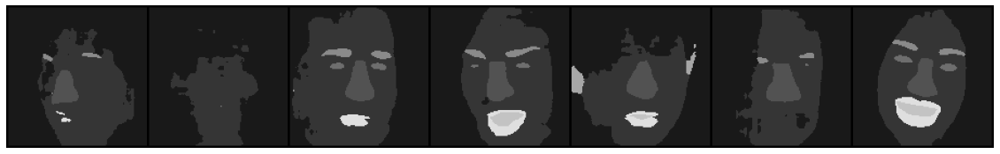

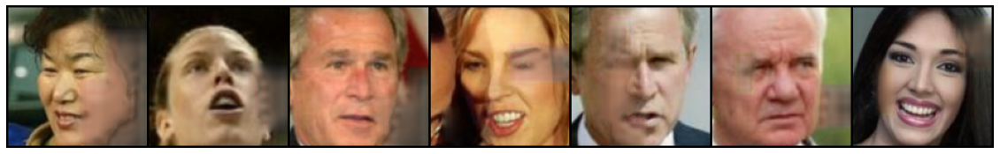

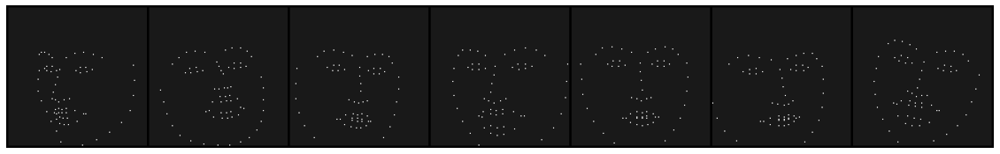

  0%|          | 0/373 [00:00<?, ?it/s]

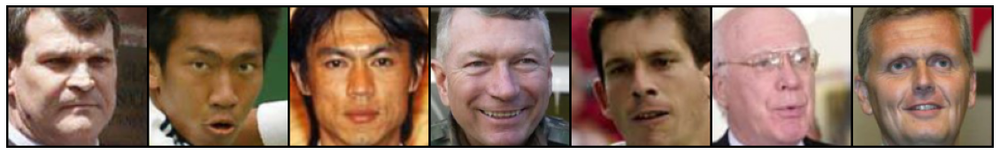

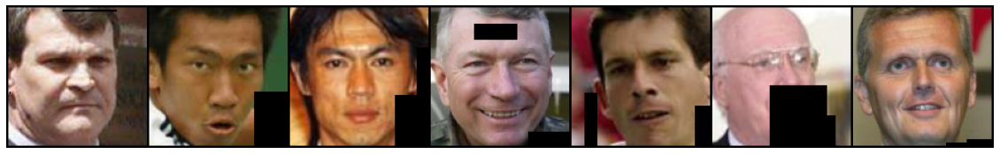

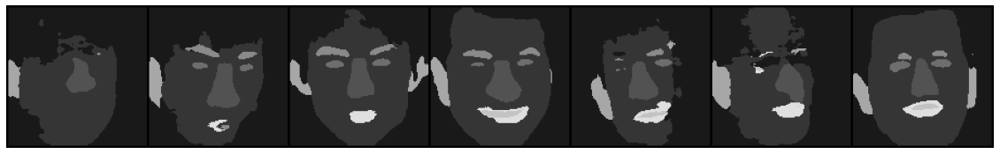

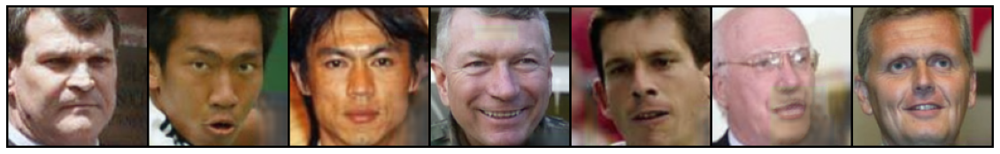

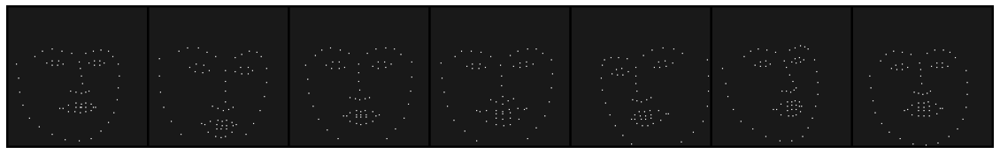

  0%|          | 0/373 [00:00<?, ?it/s]

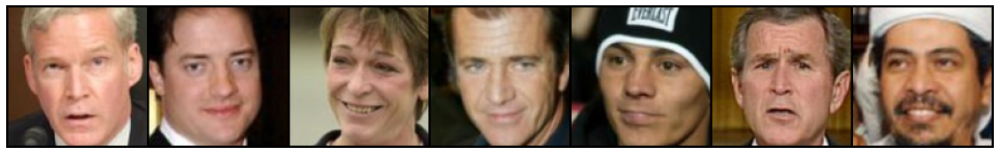

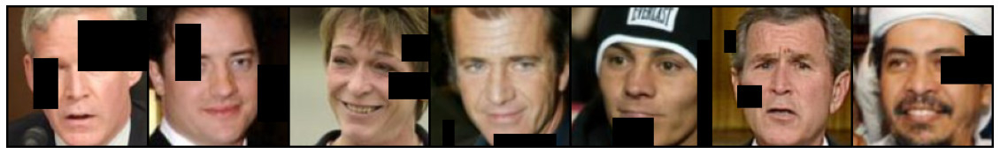

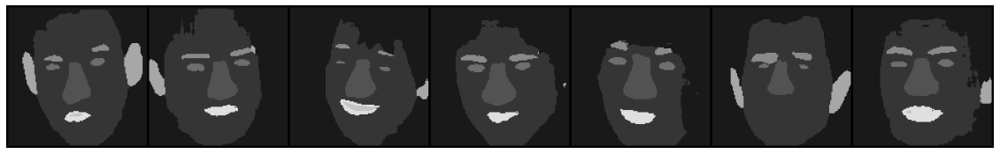

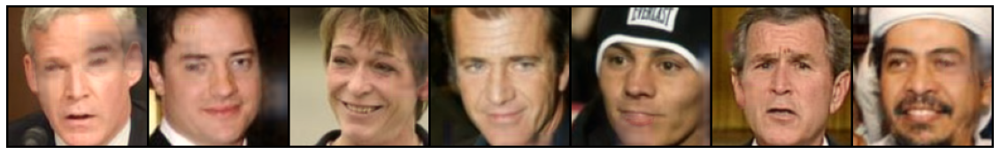

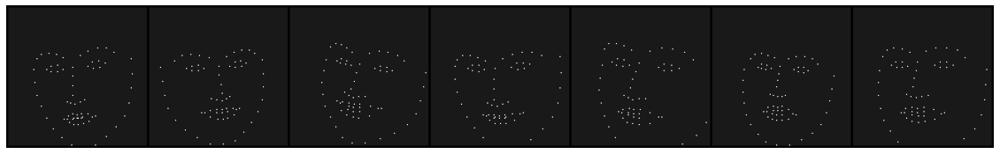

  0%|          | 0/373 [00:00<?, ?it/s]

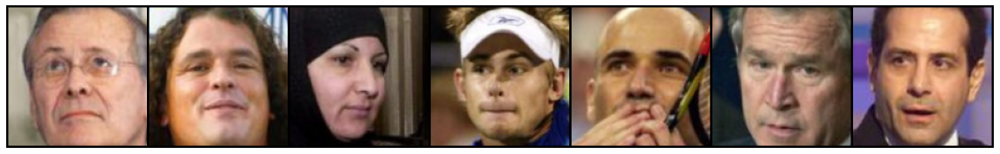

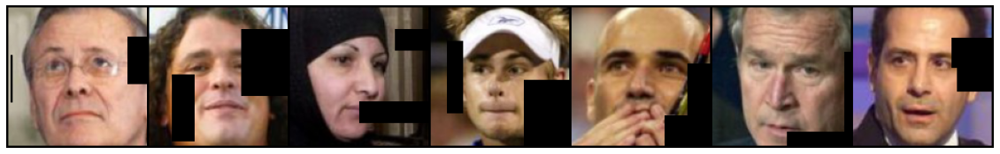

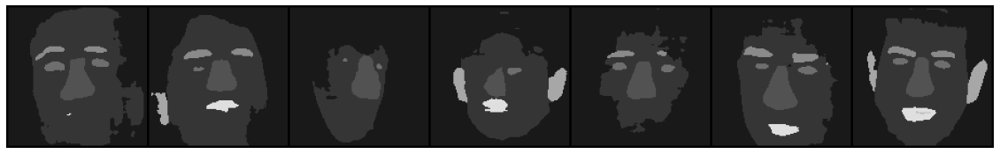

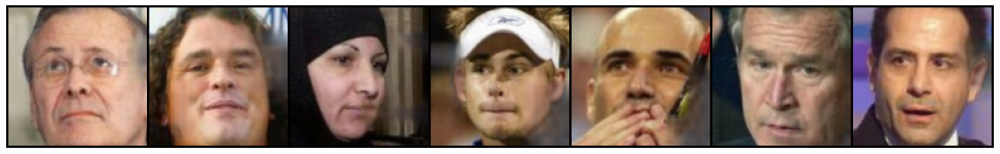

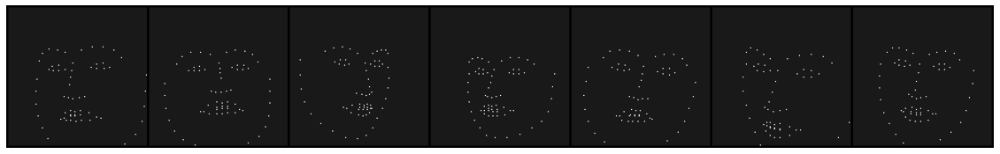

  0%|          | 0/373 [00:00<?, ?it/s]

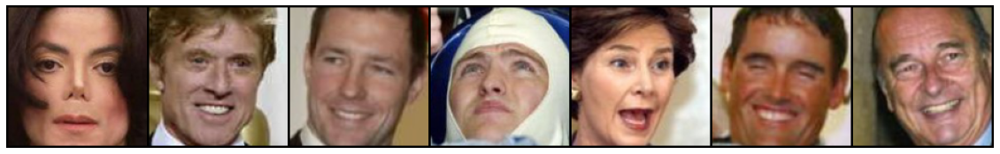

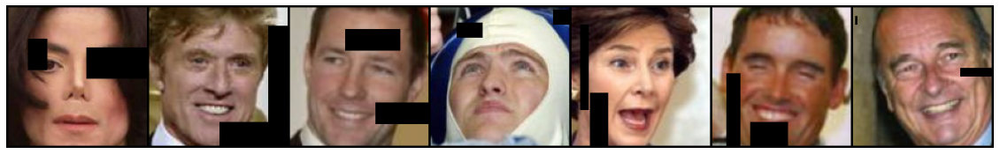

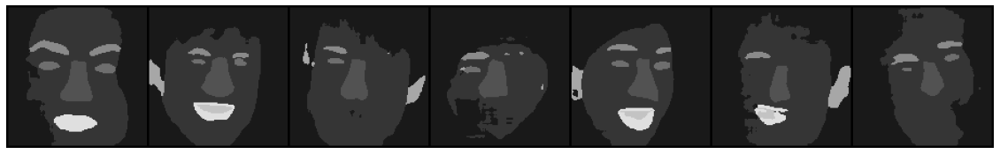

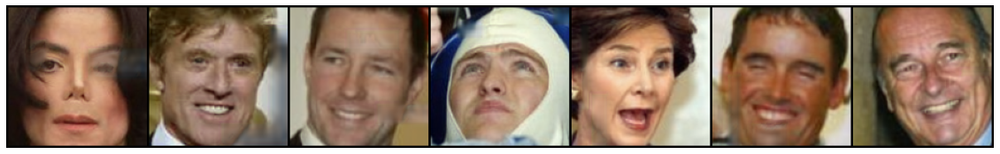

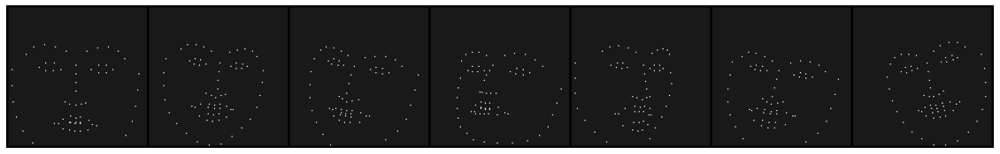

In [28]:
factorResize = 2
scale_factor = 2
model = imp.model.UNet(5, netType="partial").to(device) 
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=0.001)
trainloader, testloader = imp.data.getFaces(shuffle=True,resize=factorResize)
alter = imp.mask.Alter(resize=factorResize,seed=0,test=True).squareMask # squareMask irregularMask

#model.load_state_dict(torch.load("./modelSave/09_08/partial4channelsKeypointSQUARE_mid"))
#model.eval
train_inpainting_segmented_keypoints(model, optimizer, trainloader, alter, scale_factor=scale_factor, simplify_seg=True, epochs=5)
torch.save(model.state_dict(),"./modelSave/09_08/partial4channelsKeypointSQUARE_mid")

### Comparaison avec et sans keypoints (5ème couche)

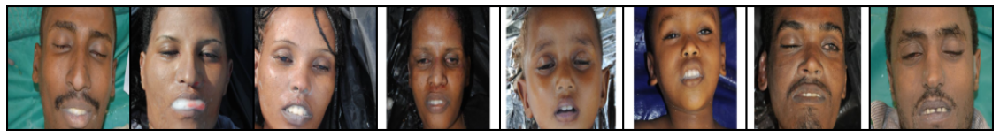

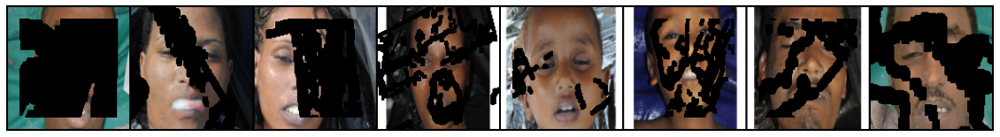

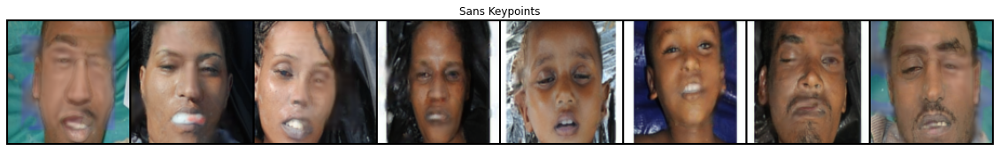

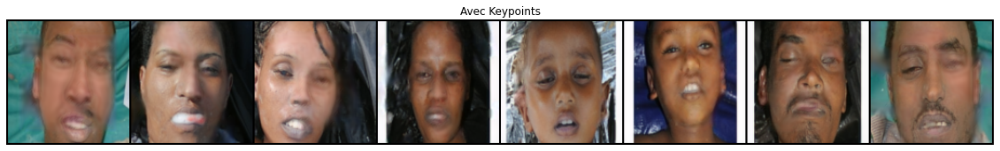

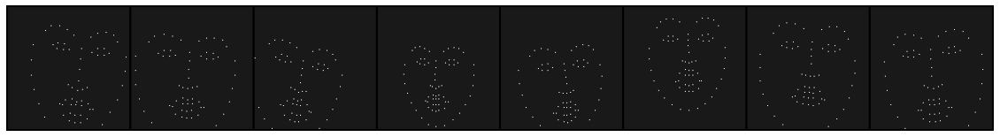

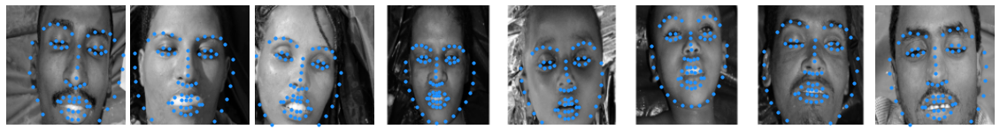

In [18]:
factorResize = 2
scale_factor = 2
seed = 3 #1 2 3 4
torch.manual_seed(seed)

dataset = getTestData("./data/real",factorResize=factorResize)
testloader = DataLoader(dataset, num_workers=2, batch_size=16, shuffle=False)

alter = imp.mask.Alter(resize=factorResize,seed=seed,test=True).irregularMask # squareMask irregularMask
x,_ = next(iter(testloader))
x = x.to(device)
plot_img(x[:8])
x_prime = alter(x)
plot_img(x_prime[:8])

# No keypoints
model = imp.model.UNet(4, netType="partial").to(device) 
model.load_state_dict(torch.load("./modelSave/02_08/partial4channels_mid"))
model.eval()
with torch.no_grad():
    alter = imp.mask.Alter(resize=factorResize,seed=seed,test=True).irregularMask # squareMask irregularMask
    test_results_sample(model, testloader, alter, simplify_seg=True,scale_factor=scale_factor, title="Sans Keypoints")

# With keypoints
model = imp.model.UNet(5, netType="partial").to(device) 
model.load_state_dict(torch.load("./modelSave/09_08/partial4channelsKeypoint_mid"))
model.eval()
with torch.no_grad():
    alter = imp.mask.Alter(resize=factorResize,seed=seed,test=True).irregularMask # squareMask irregularMask
    test_results_sample_keypoints(model, testloader, alter, simplify_seg=True,scale_factor=scale_factor, title="Avec Keypoints")
    
x_gray = torchvision.transforms.Grayscale()(x)
keypoints = keypointModel(x_gray)
visualize_batch(x_gray,keypoints)

## Basse résolution keypoints marche pas

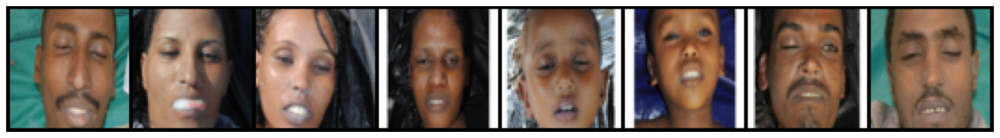

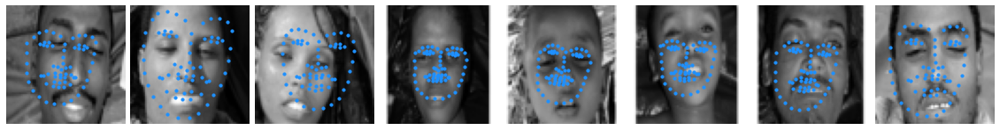

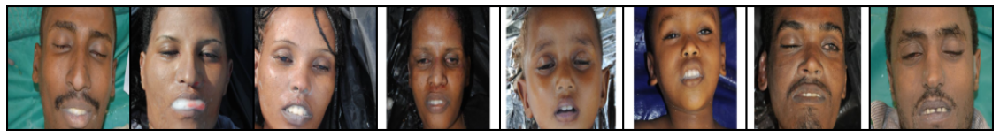

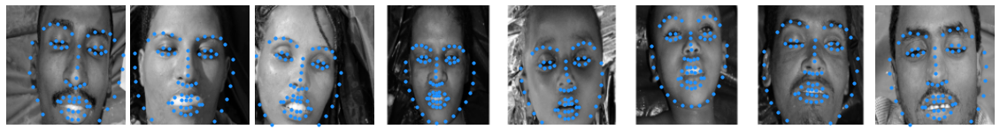

In [83]:
dataset = getTestData("./data/real",factorResize=1)
testloader = DataLoader(dataset, num_workers=2, batch_size=16, shuffle=False)
x,_ = next(iter(testloader))
x = x.to(device)
plot_img(x[:8])

x_gray = torchvision.transforms.Grayscale()(x)
keypoints = keypointModel(x_gray)
visualize_batch(x_gray,keypoints)

dataset = getTestData("./data/real",factorResize=2)
testloader = DataLoader(dataset, num_workers=2, batch_size=16, shuffle=False)
x,_ = next(iter(testloader))
x = x.to(device)
plot_img(x[:8])

x_gray = torchvision.transforms.Grayscale()(x)
keypoints = keypointModel(x_gray)
visualize_batch(x_gray,keypoints)

### Keypoints en tant que Loss et non comme couche

In [9]:
def keypointLoss(x,x_hat):
    keypointX = getKeypoints(x)
    keypointX_hat = getKeypoints(x_hat)
    mse = torch.nn.MSELoss()
    loss = mse(keypointX,keypointX_hat)
    if not loss :
        loss = 0
    return loss

In [10]:
def train_inpainting_segmented_keypointsLoss(net, optimizer, loader, alter, scale_factor=4, epochs=5, lossCoef=200, min_cut=15,max_cut=45, simplify_seg=True, show_images=True):
    
    for epoch in range(epochs):
        running_loss = []
        t = tqdm(loader)
        for x, _ in t:
            x = x.to(device)
            segmented = get_segmentation(x, simplify=simplify_seg, scale_factor=scale_factor)
            x_prime = alter(x)
            x_input = torch.cat((x_prime, segmented),dim=1)
        
            outputs = net(x_input)
            
            loss = torch.nn.L1Loss()(outputs, x) 
            loss += keypointLoss(outputs,x) * lossCoef
            loss += imp.loss.perceptualVGG(outputs, x) 
            loss += imp.loss.totalVariation(outputs, x)
            
            running_loss.append(loss.item())
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            t.set_description(f'training loss: {mean(running_loss)}, epoch: {epoch}/{epochs}')
        if show_images:
            plot_img(x[:8])
            plot_img(x_prime[:8])
            plot_img(segmented[:8])
            plot_img(torch.clip(outputs[:8], 0, 1))

In [ ]:
factorResize = 2
scale_factor = 2
lossCoef = 200
model = imp.model.UNet(4, netType="partial").to(device) 
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=0.001)
trainloader, testloader = imp.data.getFaces(shuffle=True,resize=factorResize)
alter = imp.mask.Alter(resize=factorResize,seed=0,test=True).squareMask # squareMask irregularMask

model.load_state_dict(torch.load("./modelSave/09_08/partial4channelsKeypointLOSS_mid_coef{}".format(lossCoef)))
model.eval
train_inpainting_segmented_keypointsLoss(model, optimizer, trainloader, alter, epochs=2, lossCoef=lossCoef, scale_factor=scale_factor, simplify_seg=True)
torch.save(model.state_dict(),"./modelSave/09_08/partial4channelsKeypointLOSS_mid_coef{}".format(lossCoef))

### Comparaison des 3 méthodes sur 5 epoch Square mask:
- Sans Keypoint
- Avec Keypoint en 5ème couche
- Avec Keypoint en Loss

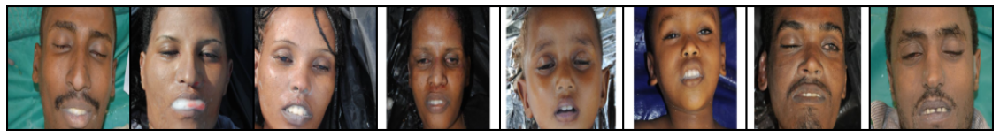

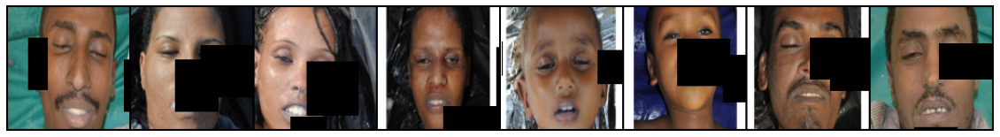

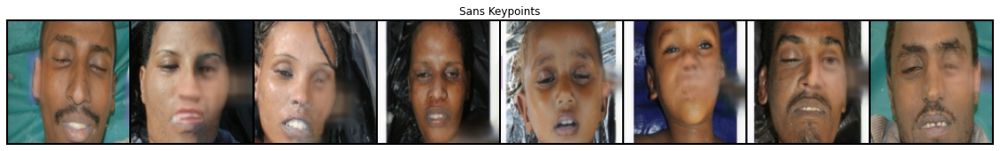

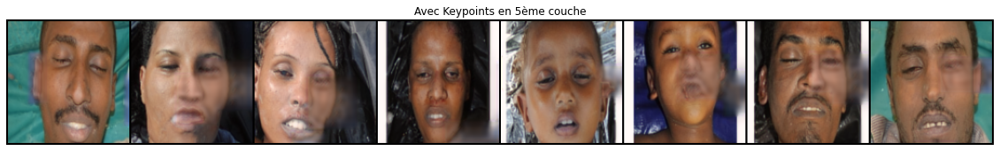

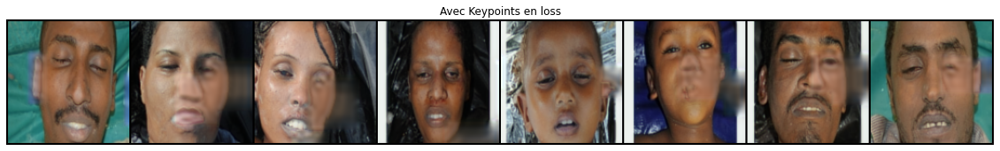

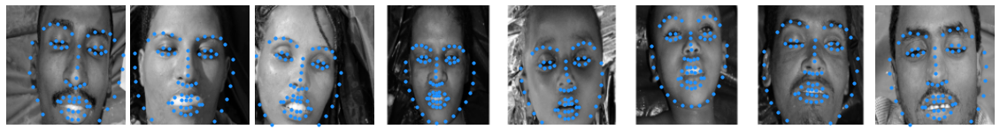

In [12]:
factorResize = 2
scale_factor = 2
seed = 4 #1 2 3 4
torch.manual_seed(seed)

dataset = getTestData("./data/real",factorResize=factorResize)
testloader = DataLoader(dataset, num_workers=2, batch_size=16, shuffle=False)

alter = imp.mask.Alter(resize=factorResize,seed=seed,test=True).squareMask # squareMask irregularMask
x,_ = next(iter(testloader))
x = x.to(device)
plot_img(x[:8])
x_prime = alter(x)
plot_img(x_prime[:8])

# No keypoints
model = imp.model.UNet(4, netType="partial").to(device) 
model.load_state_dict(torch.load("./modelSave/09_08/partial4channelsNOKeypoint_mid"))
model.eval()
with torch.no_grad():
    alter = imp.mask.Alter(resize=factorResize,seed=seed,test=True).squareMask # squareMask irregularMask
    test_results_sample(model, testloader, alter, simplify_seg=True,scale_factor=scale_factor, title="Sans Keypoints")

# With keypoints 5th 
model = imp.model.UNet(5, netType="partial").to(device) 
model.load_state_dict(torch.load("./modelSave/09_08/partial4channelsKeypointSQUARE_mid"))
model.eval()
with torch.no_grad():
    alter = imp.mask.Alter(resize=factorResize,seed=seed,test=True).squareMask # squareMask irregularMask
    test_results_sample_keypoints(model, testloader, alter, simplify_seg=True,scale_factor=scale_factor, title="Avec Keypoints en 5ème couche")

# With keypoints as loss 
model = imp.model.UNet(4, netType="partial").to(device) 
model.load_state_dict(torch.load("./modelSave/09_08/partial4channelsKeypointLOSS_mid_coef{}".format(200)))
model.eval()
with torch.no_grad():
    alter = imp.mask.Alter(resize=factorResize,seed=seed,test=True).squareMask # squareMask irregularMask
    test_results_sample(model, testloader, alter, simplify_seg=True,scale_factor=scale_factor, title="Avec Keypoints en loss")
  
    
x_gray = torchvision.transforms.Grayscale()(x)
keypoints = keypointModel(x_gray)
visualize_batch(x_gray,keypoints)